In [1]:
from nmon import *

 /Users/nikolaygusarov/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py: 34

In [482]:
N = 1
M = 2
EC_shunt = 0.18 * 1

EJ_EC_list = np.logspace(-2, 2, 10)

# ng1 = [0, 0]
# ng2 = [0.25, 0.75]
# ng2 = [0.75, 0.25]
# ng2 = [0.5, 0.5]

# ng_probes = [0, 0.25, 0.5, 0.75]
ng_probes = [0, 0.25, 0.5, 0.75]
ng_probes = np.array(list(combinations_with_replacement(ng_probes, N+M-1)))

w01_rel_true = []
w01_rel_appr = []

for EJ_EC in tqdm(EJ_EC_list):
    H_arr = []
    w01_arr = []
    w01_approx_arr = {}

    nmon = Nmon(N=N, M=M, EJN=0.001*EJ_EC*EC_shunt, EJM=EJ_EC*EC_shunt, EC_shunt=EC_shunt)

    for ng_set in ng_probes[:]:

        nmon.hamiltonian_calc(flux=0.0, ng=ng_set, num_levels=6, make_plot=False, just_H=False, cutoff=6)
        H_arr.append(np.diag(nmon.H))
        w01_arr.append(nmon.bound_state_energies[1] - nmon.bound_state_energies[0])
        diagonal = heapq.nsmallest(6, np.diag(nmon.H))
        w01_approx_arr[ diagonal[0] ] = ng_set

    w01_rel_appr[ max(list(w01_approx_arr.values())) ] = 

    w01_rel_true.append((max(w01_arr) - min(w01_arr)) / min(w01_arr))
    
    # w01_rel_appr.append(max(w01_approx_arr))




  0%|          | 0/10 [00:00<?, ?it/s]

100%|██████████| 10/10 [00:09<00:00,  1.10it/s]


 /Users/nikolaygusarov/Library/Python/3.9/lib/python/site-packages/matplotlib/cbook.py: 1699ComplexWarning: Casting complex values to real discards the imaginary part
 /Users/nikolaygusarov/Library/Python/3.9/lib/python/site-packages/matplotlib/cbook.py: 1345

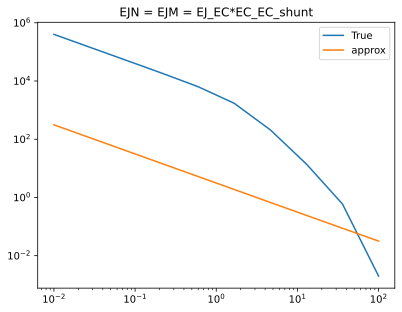

In [483]:
plt.plot(EJ_EC_list, w01_rel_true, label='True')
plt.plot(EJ_EC_list, [1e-2*np.exp(-0.09*0)*w01_rel_appr[i] for i, el in enumerate(EJ_EC_list)], label='approx')
# plt.plot(EJ_EC_list, [0.57*np.exp(-0.09*el) for el in EJ_EC_list])

plt.title("EJN = EJM = EJ_EC*EC_EC_shunt")
plt.yscale('log')
plt.xscale('log')
plt.legend()
plt.show()

In [485]:
w01_rel_true

[(399991.8958185929+0j),
 (143734.78219984792+0j),
 (51615.85139382947+0j),
 (18441.506939623265+0j),
 (6342.51412056075+0j),
 (1710.4410205630188+0j),
 (208.82480509432511+0j),
 (14.047630264943491+0j),
 (0.5932830412547743+0j),
 (0.0019958066379487335+0j)]

In [484]:
ng_probes

array([[0.  , 0.  ],
       [0.  , 0.25],
       [0.  , 0.5 ],
       [0.  , 0.75],
       [0.25, 0.25],
       [0.25, 0.5 ],
       [0.25, 0.75],
       [0.5 , 0.5 ],
       [0.5 , 0.75],
       [0.75, 0.75]])

In [290]:
mean_normalized_std(*H_arr), mean_normalized_max_diff(*H_arr), mean_normalized_max_sum_diff(*H_arr), (max(w01_arr) - min(w01_arr)) / min(w01_arr),

(((0.08718333806403965+0j), (0.040830078908860284+0j)),
 ((0.27282615411572325+0j), (0.13322294466558432+0j)),
 (0.004614595795590469+0j),
 (0.003946002156049617+0j))

In [291]:
max(w01_approx_arr)

(0.046790123456771915+0j)

In [250]:
w01_approx_arr

[(0.9999999999999999+0j),
 (0.07062180477836624+0j),
 (0.0034421213666285273+0j),
 (0.07062180477865658+0j),
 (0.9917355371900638+0j),
 (0.05846968238582086+0j),
 (0.00515504924332432+0j),
 (0.9600000000024385+0j),
 (0.0584696823864874+0j),
 (0.9917355371928688+0j)]

In [471]:
N = 1
M = 2
EC_shunt = 0.18 * 1

EJ_EC = 0.1

ng_set = [0, 0]
# ng_set = [0.25, 0.75]
# ng_set = [0.75, 0.25]
ng_set = [0., 0.5]
# ng_set = [0.5, 0.5]

'''Abs
np.sum(np.diag(nmon.H))/1e6 - gives 2 orders without ng variation
'''

nmon = Nmon(N=N, M=M, EJN=1*EJ_EC*EC_shunt, EJM=EJ_EC*EC_shunt, EC_shunt=EC_shunt)
nmon.hamiltonian_calc(flux=0.0, ng=ng_set, num_levels=6, make_plot=False, just_H=False, cutoff=10)
print(nmon.bound_state_energies[:6], nmon.transition_freqs[0])
print(heapq.nsmallest(6, np.diag(nmon.H)))
print(heapq.nlargest(6, np.diag(nmon.H)))
print(np.sum(np.diag(nmon.H))/1e6)
diagonal = heapq.nsmallest(6, np.diag(nmon.H))
print(diagonal[0])
arr = np.asarray(sorted(np.diag(nmon.H)))
# print((max(arr) - min(arr)) / max(arr))
differences = arr[:-1] - arr[1:]
result = differences / arr[1:]
# print(result[result != 0])
# print(np.mean(np.abs(result)))
# idx = np.where(diagonal == np.min(diagonal))[0][0]
# print(idx)
# idx = 198
# spread_fwd = 50
# spread_bkw = 50


# print(nmon.H[:, :])
# eigenvalues, eigenvectors = tf.linalg.eigh(nmon.H[idx-spread_bkw:idx+spread_fwd, idx-spread_bkw:idx+spread_fwd])
# eigenvalues[:6], eigenvalues[1] - eigenvalues[0] 

# [6]-[1]- ∂w01 - EJ/EC 
# 30000 - 10^2  - 0.01
#  3000 - 10^1  - 0.1
#   300 - 10^0  - 1
#    30 - 10^-1 - 10
#     1 - 10^-2 - 100
#   0.1 - 10^-3 - 1000



[3125.03504036+0.j 3125.0539224 +0.j 3125.40482391+0.j 3125.40571085+0.j
 3126.12502877+0.j 3126.12503369+0.j] (0.018882031544762867+0j)
[(3125.044998051175+0j), (3125.044998051224+0j), (3125.4049824996746+0j), (3125.40498249972+0j), (3126.1249513970215+0j), (3126.124951397185+0j)]
[(5253125.044989778+0j), (4753125.404975016+0j), (4753125.044990564+0j), (4753125.044990564+0j), (4278126.124944664+0j), (4278125.40497576+0j)]
(405.6339657920373+0j)
(3125.044998051175+0j)


In [ ]:
1, 0.25: 90000
1, 0   : 80000

100, 0.25: 900
100, 0   : 800

1, 0.25: 0.36 : (314-312)/314 = 0.006
1, 0   : 0.73 : (6.47-0)/6.47 = 1

100, 0.25 : 5.74583 : (4.67 - 3.13)/4.67 = 0.3
100, 0    : 5.74317 : (6.21 - 0)/6.21 = 1

1: sum = 40
max - min
500'000
520'000

100: sum = 0.41
5000
5250


In [1]:
from nmon import *

EC_shunt = 0.18

N = 1
M = 2

N_EJN = 20
N_EJM = 20
N_flux = 5

flux_list = np.linspace(0, 0.5, N_flux)
EJM_list = np.linspace(1*EC_shunt, 100*EC_shunt, N_EJN)
EJN_list = np.linspace(1*EC_shunt, 100*EC_shunt, N_EJM)

relative_anharm_list = np.zeros((N_EJM , N_EJN, N_flux))
w01_list = np.zeros((N_EJM , N_EJN, N_flux))
w12_list = np.zeros((N_EJM , N_EJN, N_flux))
w01_variation_list = np.zeros_like(w01_list)

for i in tqdm(range(N_EJM)):
    for j in range(N_EJN):
        nmon = Nmon(N=N, M=M, EJM=EJM_list[i], EJN=EJN_list[j], EC_shunt=EC_shunt)
        for k, flux in enumerate(flux_list):

            w01_local = np.full(2, None)

            nmon.hamiltonian_calc(flux=flux, ng=[0.0, 0.0], num_levels=4)

            relative_anharm_list[i, j, k] = nmon.relative_anharm
            w01_list[i, j, k] = nmon.transition_freqs[0]
            try:
                w12_list[i, j, k] = nmon.transition_freqs[1]
            except Exception as e:
                print(e)
                print(nmon.EC_shunt, nmon.EJN, nmon.EJM, flux, nmon.transition_freqs, nmon.bound_state_energies)
                print()



            w01_local[0] = nmon.transition_freqs[0]
            nmon.hamiltonian_calc(flux=flux, ng=[0.5, 0.5], num_levels=2)
            w01_local[1] = nmon.transition_freqs[0]

            w01_variation_list[i, j, k] = (np.max(w01_local) - np.min(w01_local))/np.min(w01_local)

  0%|          | 0/20 [00:00<?, ?it/s]3.9/lib/python/site-packages/urllib3/__init__.py: 34ComplexWarning: Casting complex values to real discards the imaginary part
 /var/folders/54/_13g4g016975q4kygn1_b9jw0000gn/T/ipykernel_47586/3291986491.py: 30ComplexWarning: Casting complex values to real discards the imaginary part
 /var/folders/54/_13g4g016975q4kygn1_b9jw0000gn/T/ipykernel_47586/3291986491.py: 31ComplexWarning: Casting complex values to real discards the imaginary part
 /var/folders/54/_13g4g016975q4kygn1_b9jw0000gn/T/ipykernel_47586/3291986491.py: 33ComplexWarning: Casting complex values to real discards the imaginary part
 55%|█████▌    | 11/20 [03:25<02:46, 18.52s/it]/T/ipykernel_47586/3291986491.py: 45

list index out of range
0.18 3.931578947368421 10.496842105263157 0.5 [(2.831874173496065+0j)] [-4.1362279 +0.j -3.54233037+0.j -3.30187446+0.j -1.30435373+0.j]



100%|██████████| 20/20 [06:10<00:00, 18.51s/it]


### no need to vary flux!!! it just changes EJ

In [2]:
np.save("./data_arrays/N={}_M={}_EC_shunt={}_EJM_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), EJM_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_EJN_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), EJN_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_flux_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), flux_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_rel_anharm_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), relative_anharm_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_w01_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), w01_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_w01_variation_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), w01_variation_list)


In [6]:
N = 1
M = 2
EC_shunt = 0.18

EJM_list = np.load("./data_arrays/N={}_M={}_EC_shunt={}_EJM_list.npy".format(N, M, round(EC_shunt, 2)))
EJN_list = np.load("./data_arrays/N={}_M={}_EC_shunt={}_EJN_list.npy".format(N, M, round(EC_shunt, 2)))
flux_list = np.load("./data_arrays/N={}_M={}_EC_shunt={}_flux_list.npy".format(N, M, round(EC_shunt, 2)))
relative_anharm_list_flux = np.load("./data_arrays/N={}_M={}_EC_shunt={}_rel_anharm_list.npy".format(N, M, round(EC_shunt, 2)))
w01_list_flux = np.load("./data_arrays/N={}_M={}_EC_shunt={}_w01_list.npy".format(N, M, round(EC_shunt, 2)))
w01_variation_list_flux = np.load("./data_arrays/N={}_M={}_EC_shunt={}_w01_variation_list.npy".format(N, M, round(EC_shunt, 2)))

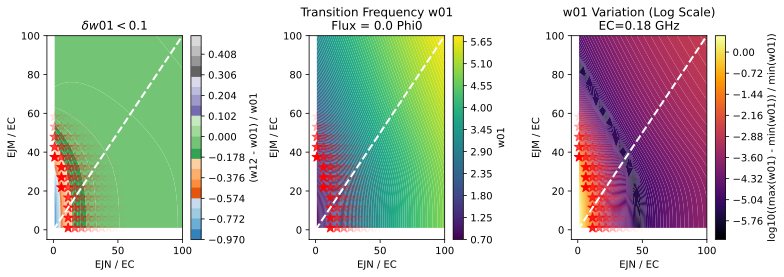

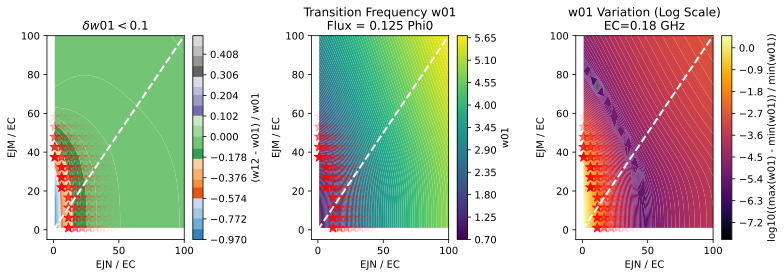

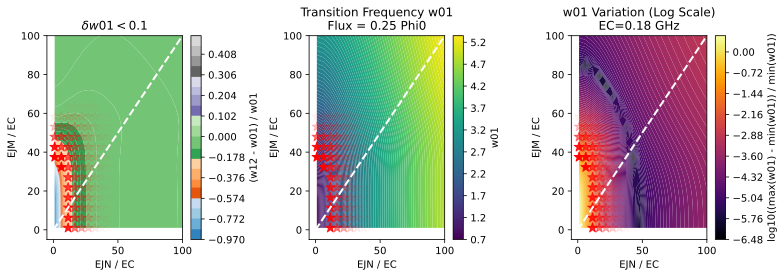

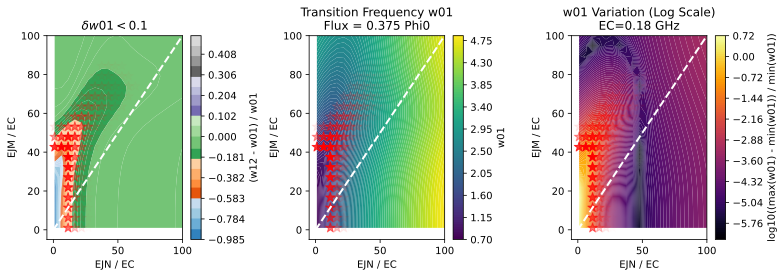

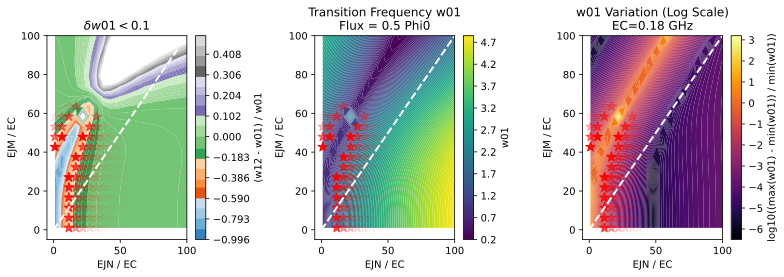

...

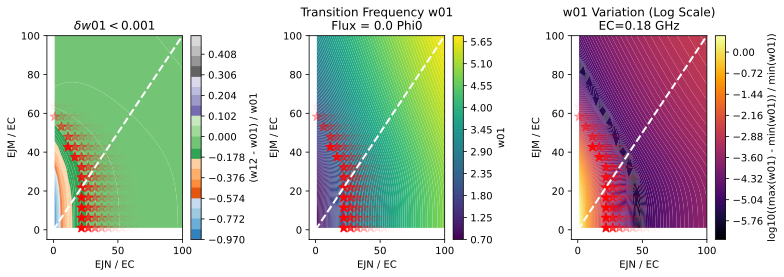

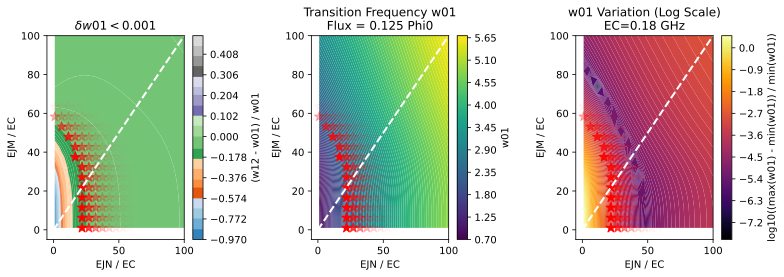

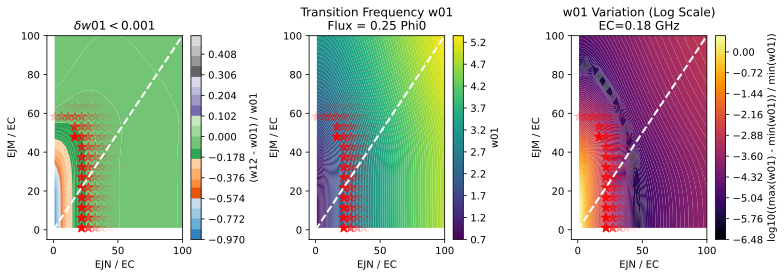

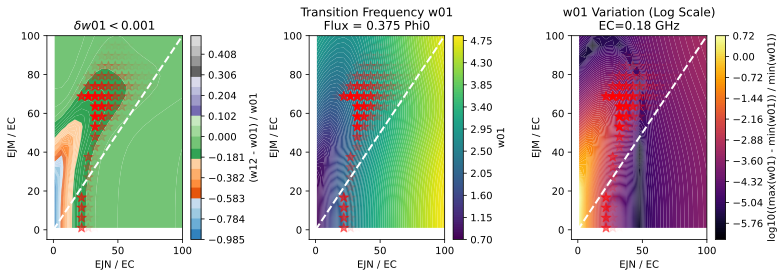

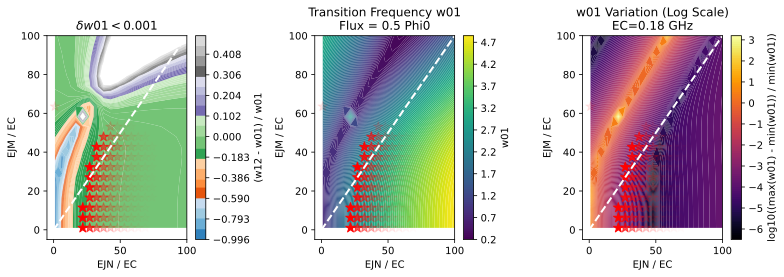

In [34]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors

w01_variation_levels = [1e-1, 1e-2, 10**(-3)]

for w01_variation_lev in w01_variation_levels:

    for k, flux_value in enumerate(flux_list[:]):

        # k = flux_list.shape[0] - 1

        EJN_grid, EJM_grid = np.meshgrid(EJN_list, EJM_list)

        # Extract arrays for the current flux value
        relative_anharm_list = relative_anharm_list_flux[:, :, k]
        w01_list = w01_list_flux[:, :, k]
        w01_variation_list = w01_variation_list_flux[:, :, k]

        # Replace NaN values in relative_anharm_list
        relative_anharm_list[np.isnan(relative_anharm_list)] = 1

        # Create DataFrame for all data points
        data = {
            'EJN': EJN_grid.flatten(),
            'EJM': EJM_grid.flatten(),
            'RelativeAnharmonicity': relative_anharm_list.flatten(),
            'w01': w01_list.flatten(),
            'w01Variation': w01_variation_list.flatten()
        }
        df = pd.DataFrame(data)

        # Filter rows where w01Variation < 10^(-1)
        filtered_df = df[df['w01Variation'] < w01_variation_lev]

        # Identify the top N_anharm points (lowest anharmonicity values)
        N_anharm = 100
        best_points = filtered_df.nsmallest(N_anharm, 'RelativeAnharmonicity')

        # Adjust alpha values for star-points
        best_anharm_values = best_points['RelativeAnharmonicity'].values
        alphas = np.ones(N_anharm)
        for i in range(1, N_anharm):
            if abs(best_anharm_values[i] - best_anharm_values[i - 1]) > 1e-3:
                alphas[i:] = np.logspace(0, -2, N_anharm - i)
                break

        # Plot with contourf and overlay star-points
        fig, axes = plt.subplots(1, 3, figsize=(11, 4))

        # First subplot: Relative Anharmonicity
        norm = colors.TwoSlopeNorm(vmin=df['RelativeAnharmonicity'].min(), vcenter=0, vmax=0.5)
        levels = np.concatenate((np.linspace(df['RelativeAnharmonicity'].min(), -1e-5, 50), 
                                np.linspace(0, 0.5, 50)))
        im1 = axes[0].contourf(EJN_grid / EC_shunt, EJM_grid / EC_shunt, 
                            relative_anharm_list, levels=levels, cmap='tab20c', norm=norm)
        fig.colorbar(im1, ax=axes[0], label='(w12 - w01) / w01')
        axes[0].set_title(r"$\delta w01 < {}$".format(round(w01_variation_lev, 3)))
        axes[0].set_xlabel('EJN / EC')
        axes[0].set_ylabel('EJM / EC')

        # Overlay star-points
        axes[0].scatter(best_points['EJN'] / EC_shunt, best_points['EJM'] / EC_shunt, 
                        s=100, c='red', marker='*', alpha=alphas)
        
        x = np.linspace(0, 100)
        axes[0].plot(x, x,'--', color = 'white', lw=2)

        # Second subplot: w01
        im2 = axes[1].contourf(EJN_grid / EC_shunt, EJM_grid / EC_shunt, 
                            w01_list, levels=100, cmap='viridis')
        fig.colorbar(im2, ax=axes[1], label='w01')
        axes[1].set_title(f"Transition Frequency w01\nFlux = {flux_value} Phi0")
        axes[1].set_xlabel('EJN / EC')
        axes[1].set_ylabel('EJM / EC')

        axes[1].plot(x, x,'--', color = 'white', lw=2)

        # Overlay star-points
        axes[1].scatter(best_points['EJN'] / EC_shunt, best_points['EJM'] / EC_shunt, 
                        s=100, c='red', marker='*', alpha=alphas)

        # Third subplot: Log10 of w01 Variation
        im3 = axes[2].contourf(EJN_grid / EC_shunt, EJM_grid / EC_shunt, 
                            np.log10(w01_variation_list), levels=100, cmap='inferno')
        fig.colorbar(im3, ax=axes[2], label='log10((max(w01) - min(w01)) / min(w01))')
        axes[2].set_title(f"w01 Variation (Log Scale)\nEC={round(EC_shunt, 2)} GHz")
        axes[2].set_xlabel('EJN / EC')
        axes[2].set_ylabel('EJM / EC')

        # Overlay star-points
        axes[2].scatter(best_points['EJN'] / EC_shunt, best_points['EJM'] / EC_shunt, 
                        s=100, c='red', marker='*', alpha=alphas)
        

        axes[2].plot(x, x,'--', color = 'white', lw=2)

        # Adjust layout and save the figure
        plt.tight_layout()
        plt.savefig(f"./data_figures/N={N}_M={M}_EC={round(EC_shunt, 2)}_flux_{k}_combined_plots.pdf")
        plt.show()


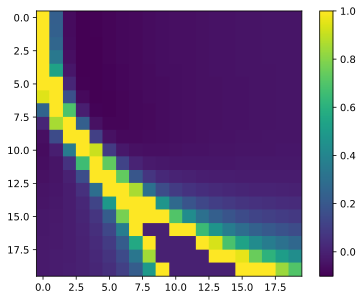

In [79]:
relative_anharm_list[np.where(relative_anharm_list > 1)] = 1

plt.imshow(relative_anharm_list)
plt.colorbar()

In [62]:
relative_anharm_list[np.where(np.isnan(relative_anharm_list))] = 0